In [ ]:
!pip install bqplot

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.2 MB 4.0 MB/s 
     |████████████████████████████████| 1.6 MB 46.0 MB/s 


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as mlp
import plotly.express as px
import bqplot
%matplotlib inline

### Checklist to do
1. Hand drawings of the viz (geographical heat maps)
2. Code line graphs/simple viz for prezo
3. Interactable viz (probably divide by state/county)
5. Slides

In [ ]:
 # Create dataframes using pandas. Merged and dropped irrelevant columns after viewing the csv in Excel and we have to use "latin-1" encoding for ANSI for the model_county
national_data = pd.read_csv('https://raw.githubusercontent.com/washingtonpost/data-2C-beyond-the-limit-usa/main/data/processed/climdiv_national_year.csv', dtype={"fips": str})
state_data = pd.merge(pd.read_csv('https://raw.githubusercontent.com/washingtonpost/data-2C-beyond-the-limit-usa/main/data/processed/climdiv_state_year.csv', dtype={"fips": str}), pd.read_csv('https://raw.githubusercontent.com/washingtonpost/data-2C-beyond-the-limit-usa/main/data/processed/model_state.csv', dtype={"fips": str}), on ='fips')
county_data = pd.merge(pd.read_csv('https://raw.githubusercontent.com/washingtonpost/data-2C-beyond-the-limit-usa/main/data/processed/climdiv_county_year.csv', dtype={"fips": str}), pd.read_csv('https://raw.githubusercontent.com/washingtonpost/data-2C-beyond-the-limit-usa/main/data/processed/model_county.csv', encoding = "latin-1", dtype={"fips": str}), on ='fips')

In [ ]:
state_data

,fips,year,temp,tempc,Fall,Spring,Summer,Winter,max_warming_season,Annual,STUSAB,STATE_NAME,STATENS
0,01,1895,61.641667,16.467593,-0.195668,-0.105862,-0.325009,0.458526,Winter,-0.035048,AL,Alabama,1779775
1,01,1896,64.266667,17.925926,-0.195668,-0.105862,-0.325009,0.458526,Winter,-0.035048,AL,Alabama,1779775
2,01,1897,64.191667,17.884259,-0.195668,-0.105862,-0.325009,0.458526,Winter,-0.035048,AL,Alabama,1779775
3,01,1898,62.983333,17.212963,-0.195668,-0.105862,-0.325009,0.458526,Winter,-0.035048,AL,Alabama,1779775
4,01,1899,63.100000,17.277778,-0.195668,-0.105862,-0.325009,0.458526,Winter,-0.035048,AL,Alabama,1779775
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,56,2015,44.158333,6.754630,1.064226,1.617750,1.256056,2.034272,Winter,1.508755,WY,Wyoming,1779807
5996,56,2016,43.908333,6.615741,1.064226,1.617750,1.256056,2.034272,Winter,1.508755,WY,Wyoming,1779807
5997,56,2017,43.200000,6.222222,1.064226,1.617750,1.256056,2.034272,Winter,1.508755,WY,Wyoming,1779807
5998,56,2018,42.408333,5.782407,1.064226,1.617750,1.256056,2.034272,Winter,1.508755,WY,Wyoming,1779807


In [ ]:
county_data

,fips,year,temp,tempc,Fall,Spring,Summer,Winter,max_warming_season,Annual,CTYNAME,STNAME
0,01001,1895,62.633333,17.018519,-0.248564,-0.073735,-0.307132,0.270039,Winter,-0.079968,Autauga County,Alabama
1,01001,1896,65.341667,18.523148,-0.248564,-0.073735,-0.307132,0.270039,Winter,-0.079968,Autauga County,Alabama
2,01001,1897,65.150000,18.416667,-0.248564,-0.073735,-0.307132,0.270039,Winter,-0.079968,Autauga County,Alabama
3,01001,1898,63.816667,17.675926,-0.248564,-0.073735,-0.307132,0.270039,Winter,-0.079968,Autauga County,Alabama
4,01001,1899,63.925000,17.736111,-0.248564,-0.073735,-0.307132,0.270039,Winter,-0.079968,Autauga County,Alabama
...,...,...,...,...,...,...,...,...,...,...,...,...
388370,56045,2015,46.633333,8.129630,0.901432,1.609256,1.241580,2.186511,Winter,1.490310,Weston County,Wyoming
388371,56045,2016,47.250000,8.472222,0.901432,1.609256,1.241580,2.186511,Winter,1.490310,Weston County,Wyoming
388372,56045,2017,45.650000,7.583333,0.901432,1.609256,1.241580,2.186511,Winter,1.490310,Weston County,Wyoming
388373,56045,2018,43.725000,6.513889,0.901432,1.609256,1.241580,2.186511,Winter,1.490310,Weston County,Wyoming


### **Average Temperature Comparison Between National and Illinois**

In [ ]:
state_data_illinois = state_data[state_data['STATE_NAME'] == 'Illinois']
state_data_illinois

,fips,year,temp,tempc,Fall,Spring,Summer,Winter,max_warming_season,Annual,STUSAB,STATE_NAME,STATENS
1250,17,1895,49.716667,9.842593,0.557305,1.153298,0.217481,1.308741,Winter,0.81442,IL,Illinois,1779784
1251,17,1896,52.200000,11.222222,0.557305,1.153298,0.217481,1.308741,Winter,0.81442,IL,Illinois,1779784
1252,17,1897,51.400000,10.777778,0.557305,1.153298,0.217481,1.308741,Winter,0.81442,IL,Illinois,1779784
1253,17,1898,51.300000,10.722222,0.557305,1.153298,0.217481,1.308741,Winter,0.81442,IL,Illinois,1779784
1254,17,1899,50.816667,10.453704,0.557305,1.153298,0.217481,1.308741,Winter,0.81442,IL,Illinois,1779784
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1370,17,2015,52.875000,11.597222,0.557305,1.153298,0.217481,1.308741,Winter,0.81442,IL,Illinois,1779784
1371,17,2016,54.733333,12.629630,0.557305,1.153298,0.217481,1.308741,Winter,0.81442,IL,Illinois,1779784
1372,17,2017,54.391667,12.439815,0.557305,1.153298,0.217481,1.308741,Winter,0.81442,IL,Illinois,1779784
1373,17,2018,52.475000,11.375000,0.557305,1.153298,0.217481,1.308741,Winter,0.81442,IL,Illinois,1779784


#### **basic attempt 1:**
we first try to explore the temperature of illinois in the form of a line plot. But we found there is no reference for it. In the final version we decide to:
1. add the national temperature data as a reference
2. add some interactivity

In [ ]:
from google.colab import output
output.disable_custom_widget_manager()

In [ ]:
# reference: lecture_13_timeseries_and_map_continued
x_sc = bqplot.DateScale()
y_sc = bqplot.LinearScale()

# Axis
x_ax = bqplot.Axis(scale=x_sc, label='Year')
y_ax = bqplot.Axis(scale=y_sc, label='temp', orientation='vertical')

lines = bqplot.Lines(x=state_data_illinois["year"], 
                     y=state_data_illinois["temp"], 
                     scales={'x':x_sc, 'y':y_sc})

line_figure = bqplot.Figure(marks = [lines], axes = [x_ax, y_ax])
line_figure

Figure(axes=[Axis(label='Year', scale=DateScale()), Axis(label='temp', orientation='vertical', scale=LinearSca…

In [ ]:
from google.colab import output
output.enable_custom_widget_manager()

In [ ]:
from google.colab import output
output.disable_custom_widget_manager()

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

#Merge 2 tables: national_data & state_data_illinois
national_illinois = pd.merge(national_data,
                             state_data_illinois,
                             on = 'year',
                             suffixes= ['_n','_i'])

fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(
    go.Scatter(x = national_illinois['year'],
               y=national_illinois['temp_n'],
               name="national_temp"),
               secondary_y=False)

fig.add_trace(
    go.Scatter(x = national_illinois['year'],
               y = national_illinois['temp_i'],
               name="illinois_temp"),
               secondary_y=True)

fig.update_layout(
            title={
                'text' : 'National/Illinois Temperature Change 1895-2019',
                'x':0.5,
                'xanchor': 'center'
       		})

# Set x-axis title
fig.update_xaxes(title_text='year')

# Set y-axis title (using same scale)
fig.update_yaxes(title_text='Temperature in Fahrenheit',
                 range=[48,56],
                 secondary_y=False)
fig.update_yaxes(range=[48,56],
                 secondary_y = True)

fig.update_traces(mode='lines',
                  hovertemplate=None)
fig.update_layout(hovermode="x unified")

fig.show()

### **Temperatures by State per Year**


**Shooting for something like this:**

In [ ]:
import PIL.Image

In [ ]:
!wget = https://www.someka.net/wp-content/uploads/2016/05/USA-Geographic-Heat-Map-Generator-Excel-Template-Someka-SS3.png

--2022-12-06 16:32:18--  http://=/
Resolving = (=)... failed: Name or service not known.
wget: unable to resolve host address ‘=’
--2022-12-06 16:32:18--  https://www.someka.net/wp-content/uploads/2016/05/USA-Geographic-Heat-Map-Generator-Excel-Template-Someka-SS3.png
Resolving www.someka.net (www.someka.net)... 162.159.135.42
Connecting to www.someka.net (www.someka.net)|162.159.135.42|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 57325 (56K) [image/png]
Saving to: ‘USA-Geographic-Heat-Map-Generator-Excel-Template-Someka-SS3.png’

USA-Geographic-Heat 100%[===================>]  55.98K   151KB/s    in 0.4s    

2022-12-06 16:32:20 (151 KB/s) - ‘USA-Geographic-Heat-Map-Generator-Excel-Template-Someka-SS3.png’ saved [57325/57325]

FINISHED --2022-12-06 16:32:20--
Total wall clock time: 1.8s
Downloaded: 1 files, 56K in 0.4s (151 KB/s)


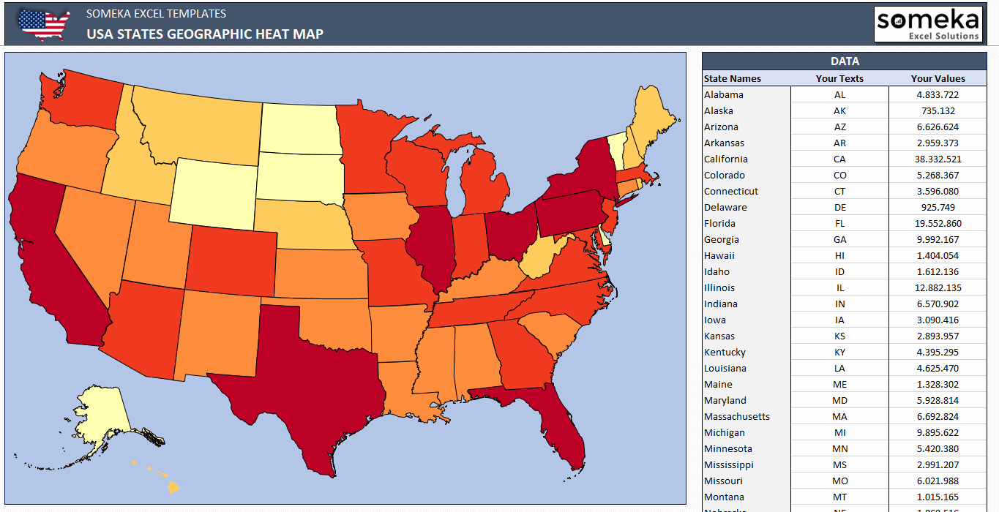

In [ ]:
country_goal = PIL.Image.open("USA-Geographic-Heat-Map-Generator-Excel-Template-Someka-SS3.png")
country_goal

####**Basic attemp 2**
explore a static heat map construction. there are a few shortcomings:
1. can barely tell that our focus is illinois
2. can barely see the temp difference through decades
3. bad choice of color scheme

In [ ]:
mydata = state_data[0:1375]
mydata

,fips,year,temp,tempc,Fall,Spring,Summer,Winter,max_warming_season,Annual,STUSAB,STATE_NAME,STATENS
0,01,1895,61.641667,16.467593,-0.195668,-0.105862,-0.325009,0.458526,Winter,-0.035048,AL,Alabama,1779775
1,01,1896,64.266667,17.925926,-0.195668,-0.105862,-0.325009,0.458526,Winter,-0.035048,AL,Alabama,1779775
2,01,1897,64.191667,17.884259,-0.195668,-0.105862,-0.325009,0.458526,Winter,-0.035048,AL,Alabama,1779775
3,01,1898,62.983333,17.212963,-0.195668,-0.105862,-0.325009,0.458526,Winter,-0.035048,AL,Alabama,1779775
4,01,1899,63.100000,17.277778,-0.195668,-0.105862,-0.325009,0.458526,Winter,-0.035048,AL,Alabama,1779775
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1370,17,2015,52.875000,11.597222,0.557305,1.153298,0.217481,1.308741,Winter,0.814420,IL,Illinois,1779784
1371,17,2016,54.733333,12.629630,0.557305,1.153298,0.217481,1.308741,Winter,0.814420,IL,Illinois,1779784
1372,17,2017,54.391667,12.439815,0.557305,1.153298,0.217481,1.308741,Winter,0.814420,IL,Illinois,1779784
1373,17,2018,52.475000,11.375000,0.557305,1.153298,0.217481,1.308741,Winter,0.814420,IL,Illinois,1779784


In [ ]:
heatmap_data = mydata.groupby([mydata['year']//10*10, 'STATE_NAME'])["temp"].mean()
heatmap_data = heatmap_data.reset_index()
heatmap_data = heatmap_data.pivot(index='year', 
                                  columns='STATE_NAME', 
                                  values='temp')
heatmap_data

STATE_NAME,Alabama,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,Florida,Georgia,Idaho,Illinois
year,,,,,,,,,,,
1890,63.236667,59.056667,60.528333,56.728333,43.445000,47.195000,53.645000,69.905000,63.568333,41.995000,51.086667
1900,63.065000,59.273333,60.126667,56.776667,44.223333,46.851667,53.230000,69.670833,63.111667,42.540000,50.787500
1910,63.291667,58.711667,60.176667,56.446667,43.607500,47.127500,53.555000,69.622500,63.324167,41.862500,51.136667
1920,63.820000,58.922500,60.847500,57.069167,43.955833,47.378333,53.847500,70.106667,63.850833,42.301667,51.514167
1930,63.902500,59.400000,61.430833,57.676667,45.103333,48.305833,54.460000,70.120000,63.970833,42.871667,52.730000
1940,63.235833,59.055833,60.556667,57.022500,44.582500,48.142500,54.322500,70.254167,63.394167,42.592500,51.901667
1950,63.330000,59.643333,60.699167,57.496667,44.952500,48.675000,54.690000,70.251667,63.558333,42.430000,51.865833
1960,61.957500,59.154167,59.757500,57.416667,44.476667,47.650833,53.437500,69.545833,62.275833,42.696667,51.011667
1970,62.310000,59.037500,59.734167,57.320833,44.327500,48.195000,54.264167,70.113333,62.975833,42.315833,51.122500


In [ ]:
# reference: lecture_13_timeseries_and_map_continued

# building a static heat map
x_sc = bqplot.OrdinalScale()
y_sc = bqplot.OrdinalScale()

clr = heatmap_data
c_sc = bqplot.ColorScale(scheme='Oranges', min=np.nanmin(clr) , max=np.nanmax(clr))

# Axis
x_ax = bqplot.Axis(scale=x_sc, label='States')
y_ax = bqplot.Axis(scale=y_sc, label='Decades', orientation='vertical')
c_ax = bqplot.ColorAxis(scale=c_sc, side='right')

# Marks
heatmap = bqplot.GridHeatMap(column=heatmap_data.columns,
                             row=heatmap_data.index,
                             scales={'column':x_sc, 'row':y_sc, 'color':c_sc}, 
                             color=clr)

# Fig
heatmap_fig = bqplot.Figure(marks=[heatmap], axes=[x_ax, y_ax, c_ax])
heatmap_fig

Figure(axes=[Axis(label='States', scale=OrdinalScale()), Axis(label='Decades', orientation='vertical', scale=O…

####**Basic Attempt 3**
make static map \


In [ ]:
us_map_data = bqplot.topo_load('map_data/USStatesMap.json')

In [ ]:
state_mean_data =mydata.groupby(['STATE_NAME', 'fips'])["temp"].mean()
clr = {}
for entry in us_map_data['objects']['subunits']['geometries']:
    fips = entry['id'] 
    if fips not in [72, 78]:
      state_abbr = states_df.loc[states_df['fips']==fips]['name_abbr'].tolist()[0]
      state_clr = clr_prep.loc[clr_prep.index==state_abbr]['ufo_id'].tolist()[0]
    
    clr[fips] = state_clr

clr

NameError: ignored

In [ ]:
state_mean_data

In [ ]:
# Color: number of UFOs sighted in states
# Data
us_map_data = bqplot.topo_load('map_data/USStatesMap.json')

# Scale
geo_sc = bqplot.AlbersUSA()
clr_sc = bqplot.ColorScale(scheme='Oranges')

# Axis
clr_ax = bqplot.ColorAxis(scale=clr_sc, side='top')

# Mark
us_map = bqplot.Map(map_data = us_map_data, 
                    scales={'projection':geo_sc, 'color':clr_sc}, 
                    color = clr)

# Fig
us_map_fig = bqplot.Figure(marks=[us_map], axes=[clr_ax], 
                           fig_margin={'top':0, 'bottom':0, 'left':0, 'right':0})
us_map_fig

In [ ]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json') as response:
    states = json.load(response)

fig = px.choropleth_mapbox(state_data,
                    geojson=states,
                    locations='fips',
                    color='temp',
                    color_continuous_scale = 'sunset',
                    range_color=(35, 75),
                    labels = {'temp':'Temperature'},
                    hover_name = 'STATE_NAME',
                    hover_data = ["Annual"],
                    mapbox_style = 'open-street-map',
                    zoom= 3,
                    center = {'lat' : 37.0902, 'lon' : -95.7129},
                    opacity = 0.8,
                    animation_frame='year')

fig.update_layout(
    margin={"r":0,"t":0,"l":0,"b":0},
    geo_scope='usa',
    )
fig.show()

### **Temperatures by County for 2019**


In [ ]:
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

fig = px.choropleth(county_data[county_data['year']==2019], 
                    geojson=counties, 
                    locations='fips', 
                    color='temp',
                    color_continuous_scale="sunset",
                    range_color=(35, 75),
                    hover_name="CTYNAME",
                    hover_data=["STNAME", "Annual"],
                    scope="usa",
                    labels={'temp':'temperature'}
                    )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### **Temperature in Illinois by County for 2019**

In [ ]:
county_data_illinois = county_data[county_data['STNAME'] == 'Illinois']
county_data_illinois_2019 = county_data_illinois[county_data_illinois['year']==2019]

In [ ]:
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

fig = px.choropleth_mapbox(county_data_illinois_2019,
                    geojson = counties,
                    locations = 'fips',
                    color = 'temp',
                    color_continuous_scale = "sunset",
                    range_color = (45, 60),
                    labels = {'temp':'Temperature'},
                    hover_name = 'CTYNAME',
                    mapbox_style = 'open-street-map',
                    zoom = 5,
                    center = {"lat": 40.1164, "lon": -88.2434},
                    opacity=0.8
                    )

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### **Comparison between max & min temp(by state)**

In [ ]:
max_min_groupby_state = state_data.groupby(['fips', 'STATE_NAME'])['temp'].agg([min, max]).reset_index()
max_min_groupby_state = max_min_groupby_state.sort_values('max', ascending = False)
max_min_groupby_state.head()

,fips,STATE_NAME,min,max
7,12,Florida,67.983333,73.358333
15,22,Louisiana,64.333333,68.916667
40,48,Texas,62.325000,67.766667
21,28,Mississippi,61.408333,66.425000
8,13,Georgia,61.400000,66.225000


In [ ]:
fig = make_subplots(specs=[[{'secondary_y': True}]])

fig.add_trace(
    go.Scatter(x = max_min_groupby_state['STATE_NAME'],
               y = max_min_groupby_state['max'],
               name = 'maximum temp'),
               secondary_y = False)

fig.add_trace(
    go.Scatter(x = max_min_groupby_state['STATE_NAME'],
               y = max_min_groupby_state['min'],
               name="minimum temp"),
               secondary_y = True)

fig.update_layout(
            title={
                'text' : 'Temperature Difference by State',
                'x' : 0.5,
                'xanchor' : 'center'
       		})

# Set x-axis title
fig.update_xaxes(title_text = 'State')

# Set y-axes titles(using same scale)
fig.update_yaxes(title_text = 'Temperature in Fahrenheit',
                 range=[30,75],
                 secondary_y = False)

fig.update_yaxes(range=[30,75], secondary_y=True)

fig.update_traces(mode='lines')

fig.update_layout(hovermode = 'x unified')
fig.show()

### **Temperature in Illinois by County (2010-2019)**

In [ ]:
county_data_illinois_20102019 = county_data_illinois[(county_data_illinois['year'] >= 2010) & (county_data_illinois['year'] <= 2019)]
county_data_illinois_20102019.head()

In [ ]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

fig = px.choropleth_mapbox(county_data_illinois_20102019,
                    geojson = counties,
                    locations = 'fips',
                    color = 'temp',
                    color_continuous_scale = "sunset",
                    range_color = (45, 60),
                    labels = {'temp':'Temperature'},
                    hover_name = 'CTYNAME',
                    mapbox_style = 'open-street-map',
                    zoom = 4.7,
                    center = {"lat": 40.1164, "lon": -88.2434},
                    opacity=0.8,
                    animation_frame= 'year')

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()